<a href="https://colab.research.google.com/github/Anushdubey01/OpenCV-Projects/blob/main/Task%202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Deep Learning & Computer Vision**
## **Name - Anush Dubey**
## **Roll No.- 20MIP10001**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **1.	Thresholding**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


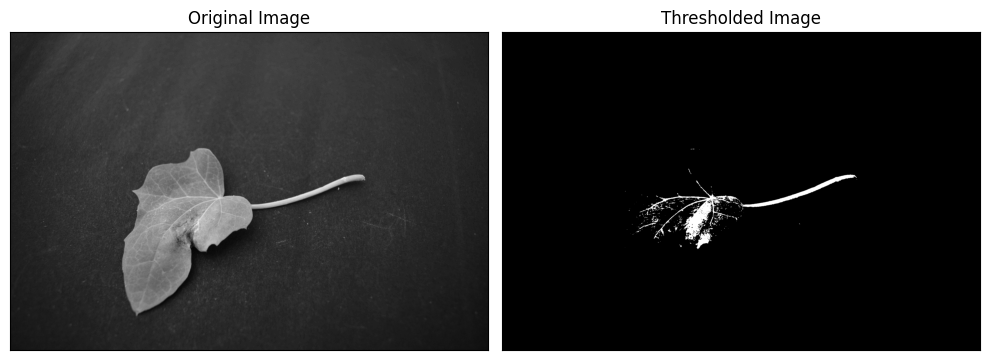

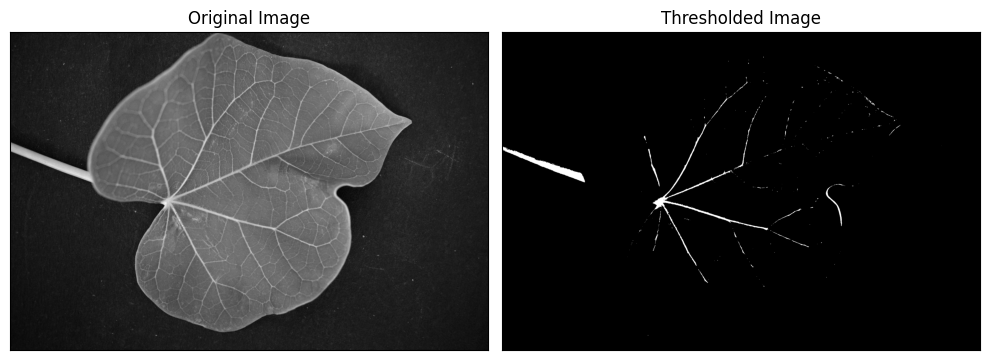

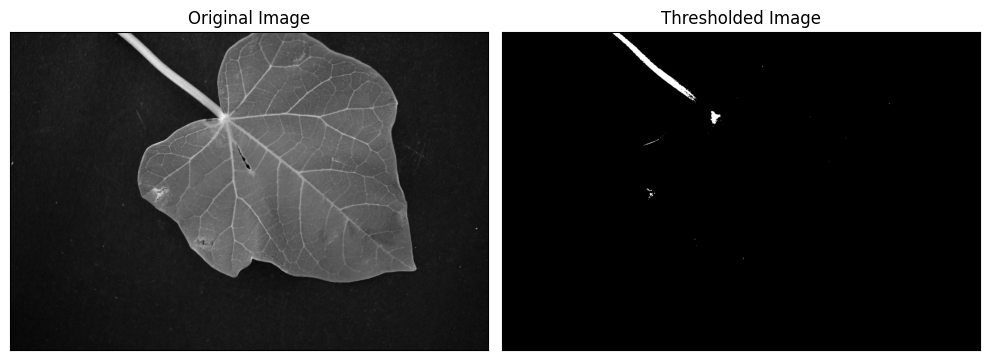

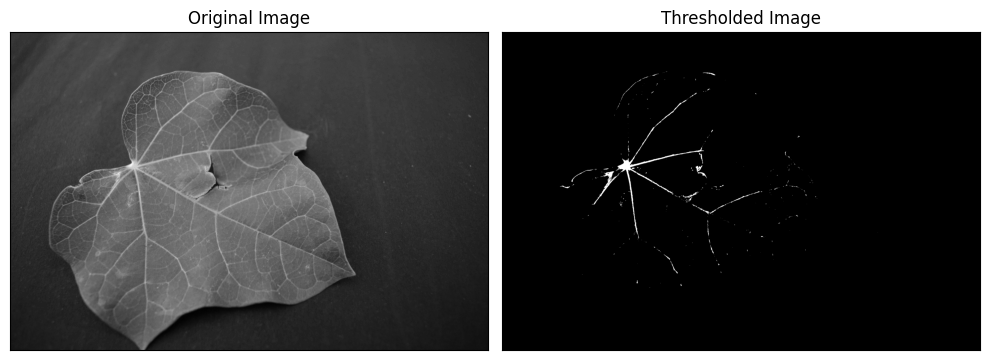

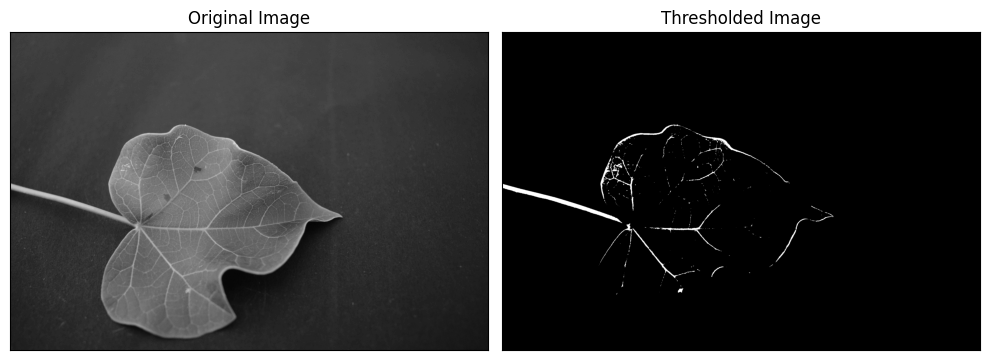

In [5]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to the folder containing the images in Google Drive
folder_path = '/content/drive/MyDrive/imagesegmentation/'

# List all image filenames in the folder
image_filenames = [os.path.join(folder_path, filename) for filename in os.listdir(folder_path) if filename.endswith('.JPG')][:5]  # Select the first 5 images

# Loop through each image filename
for filename in image_filenames:
    # Load an image in grayscale
    image = cv2.imread(filename, cv2.IMREAD_GRAYSCALE)
    if image is None:
        print(f"Failed to load {filename}")
        continue  # Skip to the next image if loading fails

    # Apply simple thresholding
    _, thresholded = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

    # Display the original and thresholded images
    plt.figure(figsize=(10, 5))  # Adjust the figure size if needed
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')
    plt.xticks([]), plt.yticks([])

    plt.subplot(1, 2, 2)
    plt.imshow(thresholded, cmap='gray')
    plt.title('Thresholded Image')
    plt.xticks([]), plt.yticks([])

    plt.tight_layout()
    plt.show()


# **2.	Region Based Image Segmentation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


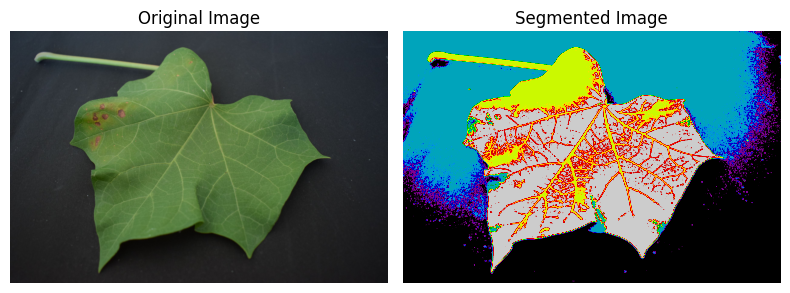

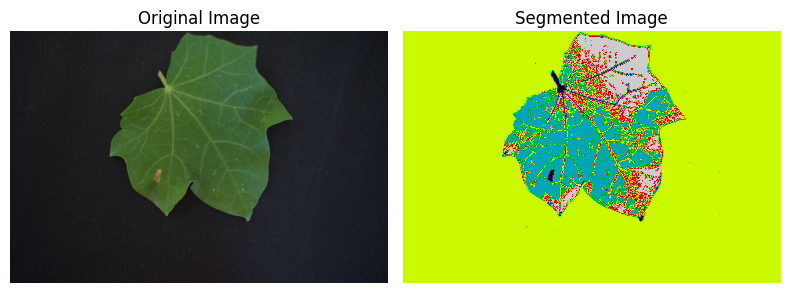

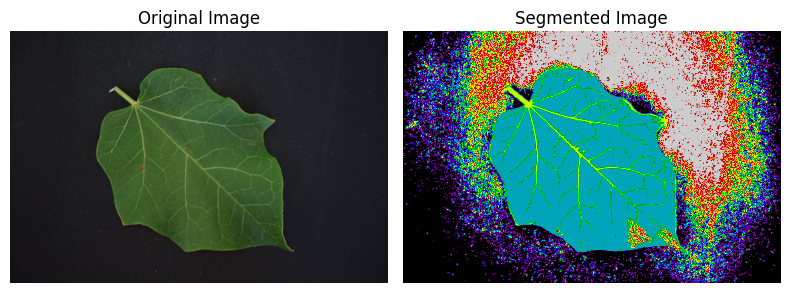

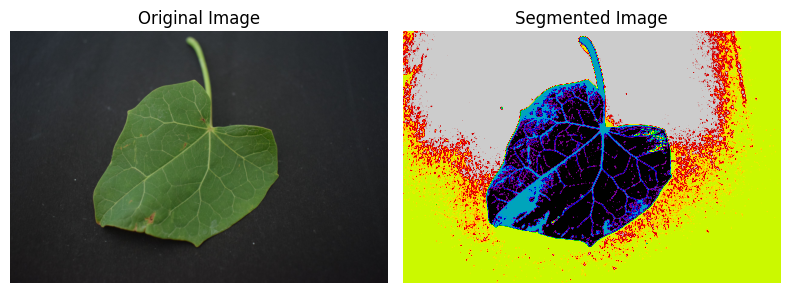

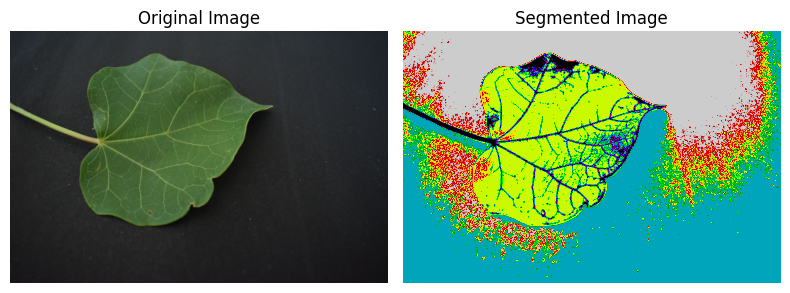

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to the folder containing the images in Google Drive
folder_path = '/content/drive/MyDrive/imagesegmentation/'

# List of 5 image filenames to perform segmentation on
image_filenames = [
    '1.JPG',
    '2.JPG',
    '3.JPG',
    '4.JPG',
    '5.JPG'
]

# Loop through each image filename
for filename in image_filenames:
    # Load the image
    image = cv2.imread(folder_path + filename)
    if image is None:
        print(f"Failed to load {filename}")
        continue  # Skip to the next image if loading fails

    # Convert the image to RGB (OpenCV loads images in BGR format)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Flatten the image to a 2D array of pixels
    pixels = image_rgb.reshape((-1, 3))

    # Convert to floating-point for K-Means
    pixels = np.float32(pixels)

    # Define the criteria and number of clusters for K-Means
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    num_clusters = 4

    # Apply K-Means clustering
    _, labels, centers = cv2.kmeans(pixels, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert the cluster labels to a 2D mask
    segmented_mask = labels.reshape(image.shape[0], image.shape[1])

    # Display the original and segmented images
    plt.figure(figsize=(8, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(segmented_mask, cmap='nipy_spectral')
    plt.title('Segmented Image')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


# **3.	Region growing Image Segmentation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-11-aebc7a64f643>:9: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  visited = np.zeros((rows, cols), dtype=np.bool)
<ipython-input-11-aebc7a64f643>:17: RuntimeWarning: overflow encountered in ubyte_scalars
  if not visited[row, col] and np.abs(image[row, col] - image[seed]) <= threshold:


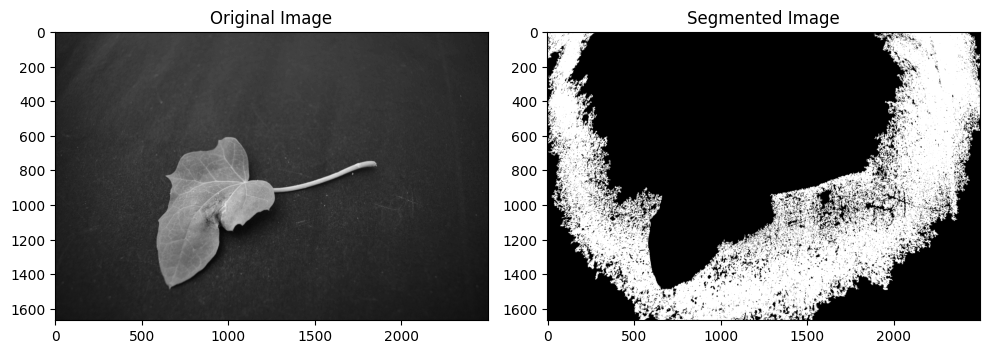

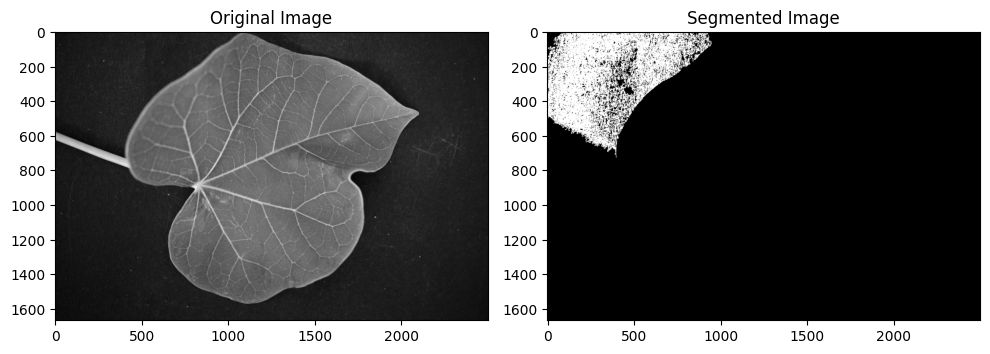

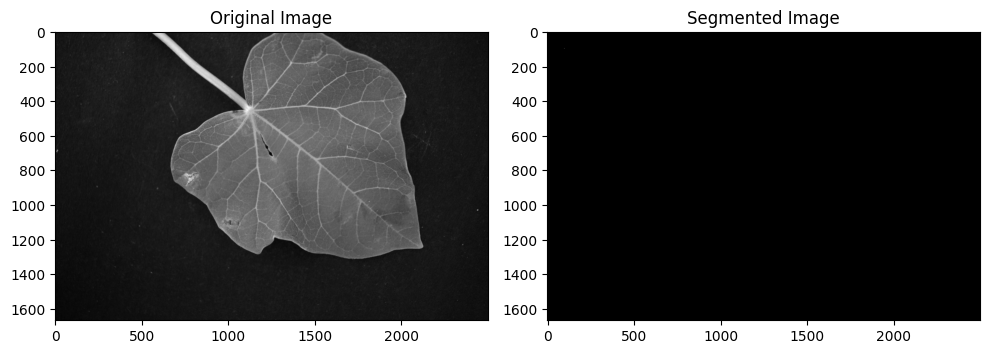

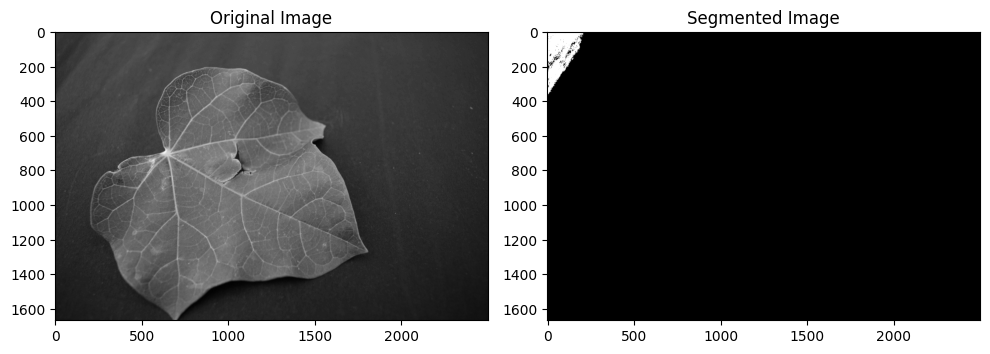

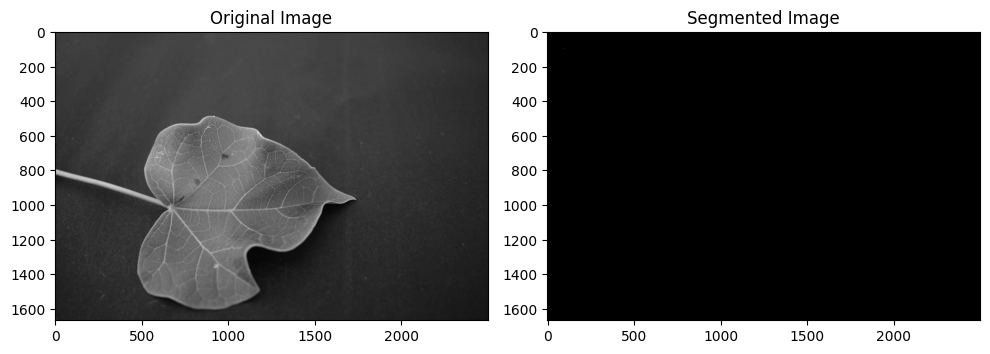

...

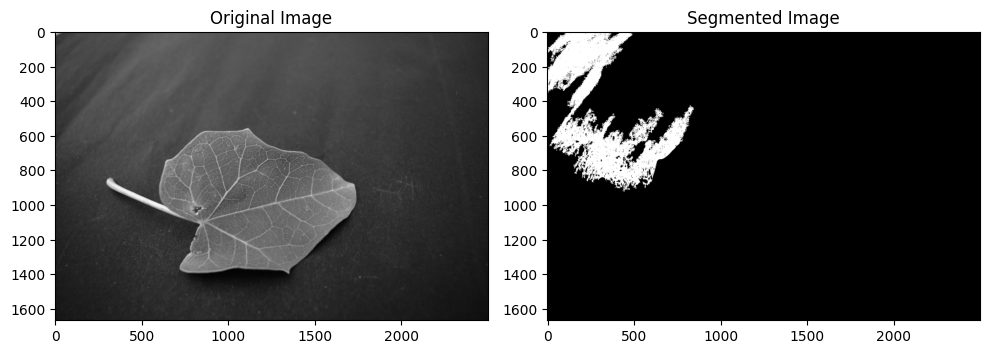

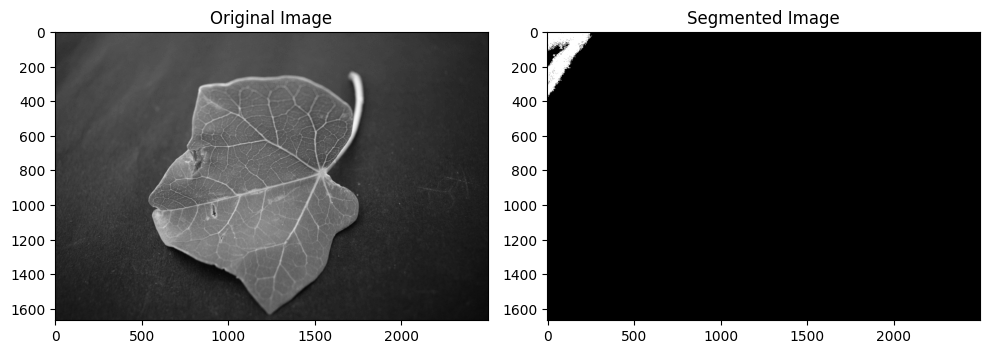

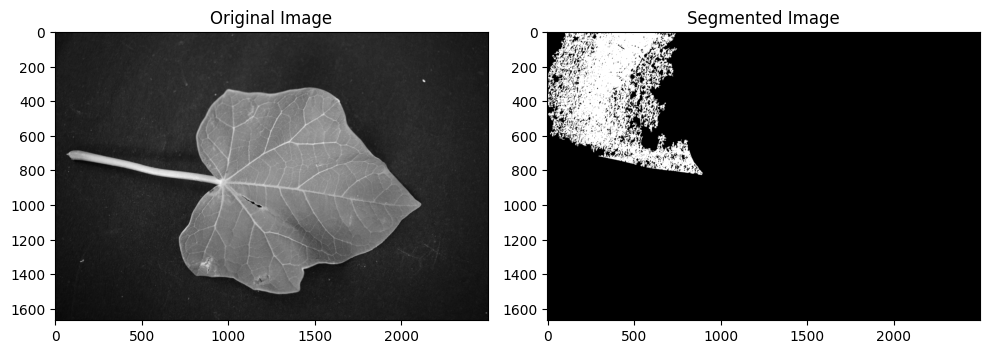

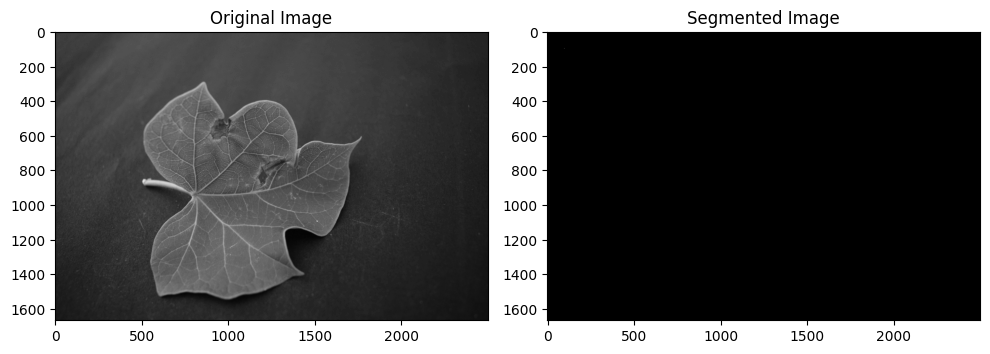

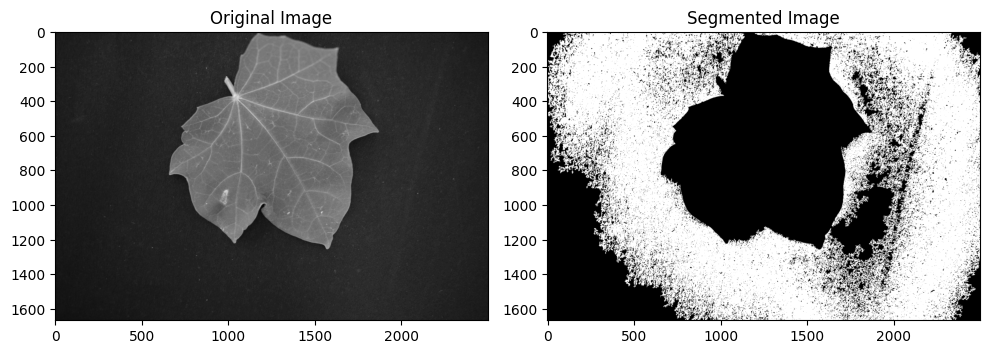

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from google.colab import drive

def region_growing(seed, image, threshold):
    rows, cols = image.shape
    visited = np.zeros((rows, cols), dtype=np.bool)
    segmented = np.zeros((rows, cols), dtype=np.uint8)

    queue = []
    queue.append(seed)

    while queue:
        row, col = queue.pop(0)
        if not visited[row, col] and np.abs(image[row, col] - image[seed]) <= threshold:
            visited[row, col] = True
            segmented[row, col] = 255

            neighbors = [(row - 1, col), (row + 1, col), (row, col - 1), (row, col + 1)]
            for n_row, n_col in neighbors:
                if 0 <= n_row < rows and 0 <= n_col < cols:
                    queue.append((n_row, n_col))

    return segmented

# Mount Google Drive
drive.mount('/content/drive')

# Path to the folder containing the images in Google Drive
folder_path = '/content/drive/MyDrive/imagesegmentation/'

# List of image filenames in the folder
image_filenames = os.listdir(folder_path)

# Loop through each image and perform segmentation
for filename in image_filenames:
    # Load the image in grayscale
    image = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Failed to load {filename}")
        continue  # Skip to the next image if loading fails

    # Seed point for region growing
    seed_row, seed_col = 100, 100

    # Define the region growing threshold
    threshold = 10  # Adjust this threshold based on your image and requirements

    # Perform region growing
    segmented = region_growing((seed_row, seed_col), image, threshold)

    # Display the original and segmented images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1, 2, 2)
    plt.imshow(segmented, cmap='gray')
    plt.title('Segmented Image')

    plt.tight_layout()
    plt.show()


# **4.	Edge based Image Segmentation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


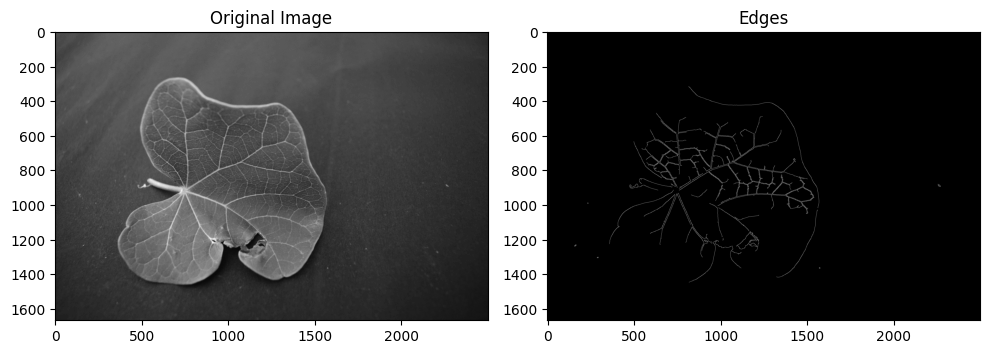

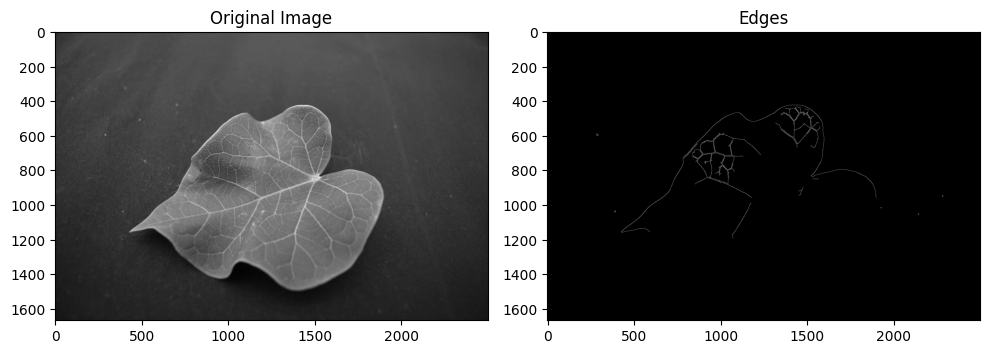

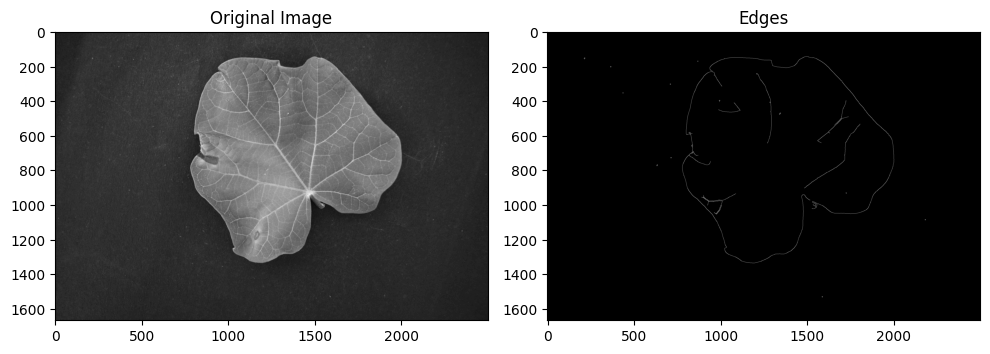

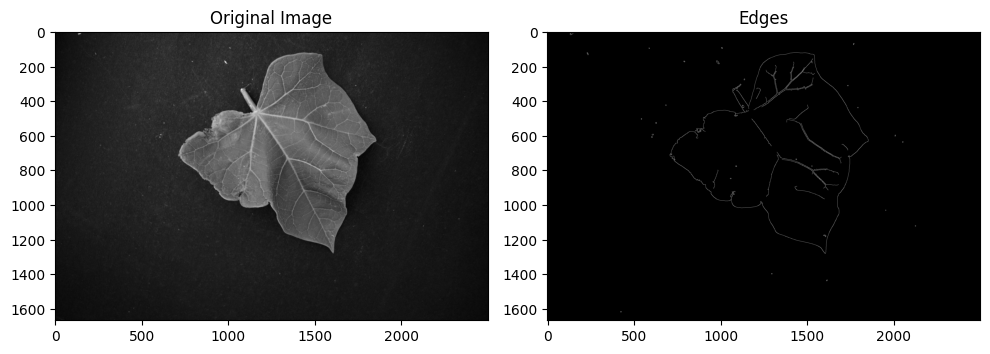

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to the folder containing the images in Google Drive
folder_path = '/content/drive/MyDrive/imagesegmentation/'

# List of image filenames (7.JPG to 10.JPG)
image_filenames = [
    '7.JPG',
    '8.JPG',
    '9.JPG',
    '10.JPG'
]

# Loop through each image and perform image processing
for filename in image_filenames:
    # Load the image in grayscale
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Failed to load {filename}")
        continue  # Skip to the next image if loading fails

    # Apply Gaussian blur to reduce noise and improve edge detection
    blurred = cv2.GaussianBlur(image, (5, 5), 0)

    # Apply Canny edge detection
    edges = cv2.Canny(blurred, threshold1=50, threshold2=150)

    # Display the original and edge-detected images side by side
    plt.figure(figsize=(10, 5))

    # Subplot for the original grayscale image
    plt.subplot(1, 2, 1)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    # Subplot for the edge-detected image
    plt.subplot(1, 2, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Edges')

    # Adjust layout for better presentation
    plt.tight_layout()

    # Display the plot with the images
    plt.show()


# **5.	Clustering**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


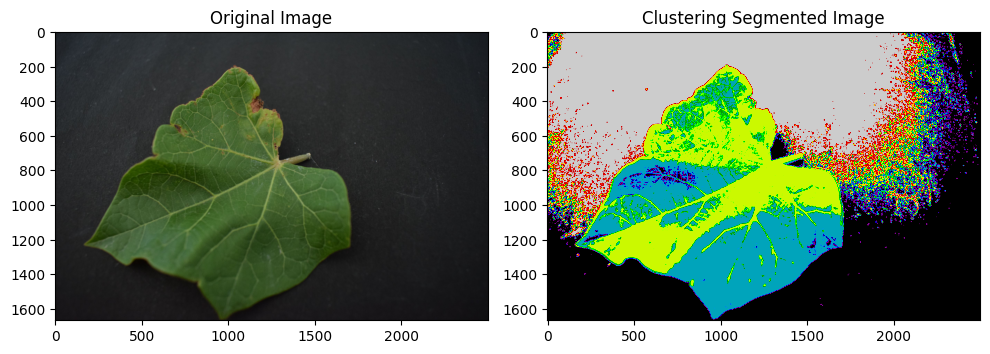

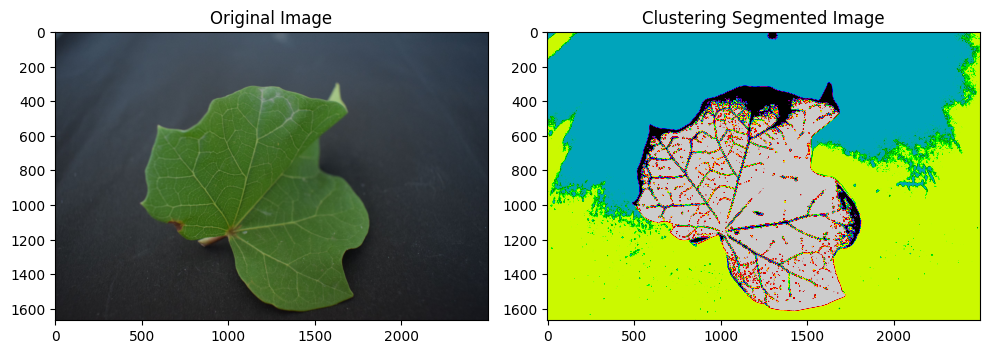

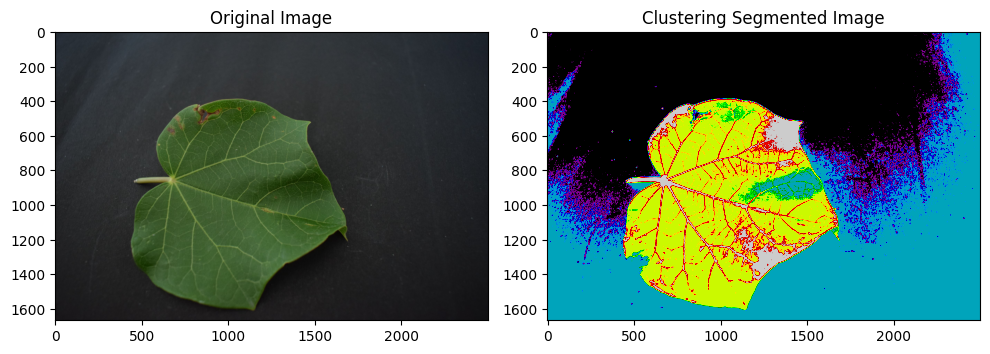

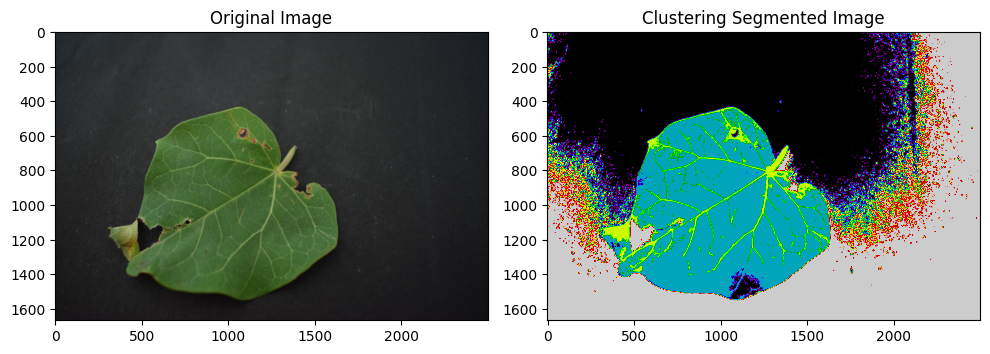

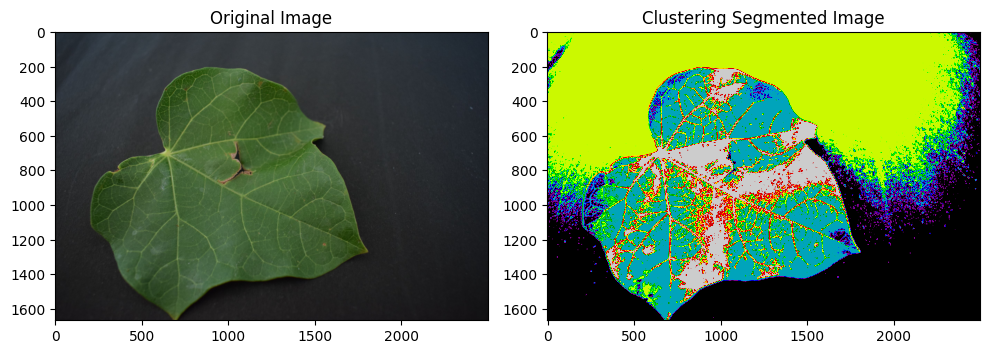

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Path to the folder containing the images in Google Drive
folder_path = '/content/drive/MyDrive/imagesegmentation/'

# List of image filenames (11.JPG to 15.JPG)
image_filenames = [
    '11.JPG',
    '12.JPG',
    '13.JPG',
    '14.JPG',
    '15.JPG'
]

# Loop through each image and perform image segmentation
for filename in image_filenames:
    # Load the image from the file
    image_path = os.path.join(folder_path, filename)
    image = cv2.imread(image_path)

    if image is None:
        print(f"Failed to load {filename}")
        continue  # Skip to the next image if loading fails

    # Convert the image to RGB color space (OpenCV loads images in BGR format)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Reshape the image to a 2D array of pixels, where each row contains the RGB values of a pixel
    pixels = image_rgb.reshape((-1, 3))

    # Convert pixel values to floating-point format for compatibility with K-Means
    pixels = np.float32(pixels)

    # Define the criteria for K-Means convergence and the number of clusters to find
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
    num_clusters = 4

    # Apply K-Means clustering to group similar pixel colors into clusters
    # The result includes cluster labels and centers
    _, labels, centers = cv2.kmeans(pixels, num_clusters, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    # Convert the cluster labels to a 2D mask, reshaped to match the image dimensions
    segmented_mask = labels.reshape(image.shape[0], image.shape[1])

    # Display the original and segmented images side by side using Matplotlib
    plt.figure(figsize=(10, 5))  # Set the size of the figure
    plt.subplot(1, 2, 1)  # Create the first subplot
    plt.imshow(image_rgb)  # Display the original RGB image
    plt.title('Original Image')  # Set the title for the subplot

    plt.subplot(1, 2, 2)  # Create the second subplot
    plt.imshow(segmented_mask, cmap='nipy_spectral')  # Display the segmented mask as an image with the specified colormap
    plt.title('Clustering Segmented Image')  # Set the title for the subplot

    plt.tight_layout()  # Adjust layout to prevent overlapping
    plt.show()  # Display the plot containing both subplots


# **6.	ANN based Image Segmentation**

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
1/1 [==============================] - 1s 958ms/step


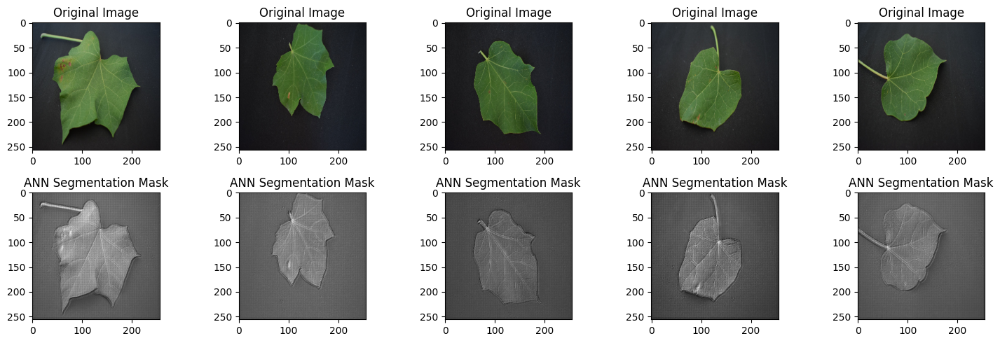

In [52]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from google.colab import drive
import matplotlib.pyplot as plt

# Mount Google Drive
drive.mount('/content/drive')

# Define the U-Net architecture
def unet(input_shape):
    inputs = keras.Input(input_shape)

    # Encoder
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = layers.MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = layers.MaxPooling2D(pool_size=(2, 2))(conv2)

    # Middle
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = layers.Conv2D(256, 3, activation='relu', padding='same')(conv3)

    # Decoder
    upconv2 = layers.Conv2DTranspose(128, 2, strides=(2, 2), padding='same')(conv3)
    concat2 = layers.concatenate([conv2, upconv2], axis=-1)
    conv4 = layers.Conv2D(128, 3, activation='relu', padding='same')(concat2)
    conv4 = layers.Conv2D(128, 3, activation='relu', padding='same')(conv4)

    upconv1 = layers.Conv2DTranspose(64, 2, strides=(2, 2), padding='same')(conv4)
    concat1 = layers.concatenate([conv1, upconv1], axis=-1)
    conv5 = layers.Conv2D(64, 3, activation='relu', padding='same')(concat1)
    conv5 = layers.Conv2D(64, 3, activation='relu', padding='same')(conv5)

    # Output
    outputs = layers.Conv2D(1, 1, activation='sigmoid')(conv5)

    model = keras.Model(inputs, outputs)
    return model

# Define the load_and_preprocess_image function
def load_and_preprocess_image(image_path, target_size):
    image = keras.preprocessing.image.load_img(image_path, target_size=target_size)
    image_array = keras.preprocessing.image.img_to_array(image)
    image_array = image_array / 255.0  # Normalize pixel values
    return image_array

# Load the model
input_shape = (256, 256, 3)  # Adjust the input shape as needed
model = unet(input_shape)
model.compile(optimizer='adam', loss='binary_crossentropy')

# List of image filenames
image_path = '/content/drive/MyDrive/imagesegmentation/'
image_filenames = ['1.JPG', '2.JPG', '3.JPG', '4.JPG', '5.JPG']

# Create subplots for displaying multiple images
plt.figure(figsize=(15, 5))

for i, image_filename in enumerate(image_filenames):
    image_file_path = image_path + image_filename

    # Load and preprocess the image
    input_image = load_and_preprocess_image(image_file_path, target_size=input_shape[:2])

    # Perform segmentation
    segmentation_mask = model.predict(np.expand_dims(input_image, axis=0))[0]

    # Post-process the mask if needed (thresholding, etc.)
    # ...

    # Display the original image and the segmentation mask in subplots
    plt.subplot(2, len(image_filenames), i + 1)
    plt.imshow(input_image)
    plt.title('Original Image')

    plt.subplot(2, len(image_filenames), len(image_filenames) + i + 1)
    plt.imshow(segmentation_mask, cmap='gray')
    plt.title('ANN Segmentation Mask')

plt.tight_layout()
plt.show()
